<center>
    
## Aprendizaje No Supervisado DiploDatos
    Laura Alonso Alemany, Ana Georgina Flesia y Valeria Rulloni
## Agrupamiento con el FIFA 2021 dataset
 


## 1.-Inicialización-del-entorno

Empezamos cargando algunas herramientas para cargar los datos y manipularlos.

In [ ]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns',100)
pd.set_option('display.max_rows',1000)
import itertools
import warnings
warnings.filterwarnings("ignore")
import io

In [ ]:
from plotly.offline import init_notebook_mode, plot,iplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)
import matplotlib.pyplot as plt
import plotly.tools as tls#visualization
import plotly.figure_factory as ff#visualization
import seaborn as sns

In [ ]:
from sklearn.cluster import KMeans,MeanShift
from sklearn import decomposition
from sklearn import (manifold, preprocessing, decomposition)
from sklearn.cluster import AgglomerativeClustering

## 2.-Preparación-de-los-datos y exploración de la base

Cargamos los datos bajados de la database de [Kaggle](https://www.kaggle.com/karangadiya/fifa19) como 'data.csv'. 

In [ ]:
Data_Link = 'https://raw.githubusercontent.com/sase1988/IANS/master/players_21.csv'

df=pd.read_csv(Data_Link, sep=',')

In [ ]:
df.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club_name,league_name,league_rank,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,...,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,33,1987-06-24,170,72,Argentina,FC Barcelona,Spain Primera Division,1.0,93,93,67500000,560000,"RW, ST, CF",Left,5,4,4,Medium/Low,Messi,Yes,138400000.0,#Dribbler #Distance Shooter #FK Specialist #Ac...,CAM,10.0,NaN,2004-07-01,2021.0,RW,10.0,85.0,92.0,91.0,95.0,38.0,65.0,NaN,NaN,NaN,NaN,NaN,NaN,Finesse Shot Long Shot Taker (AI) Speed Dribbl...,85,95,70,91,...,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,NaN,35,24,6,11,15,14,8,89+3,89+3,89+3,92+0,93+0,93+0,93+0,92+0,93+0,93+0,93+0,91+2,87+3,87+3,87+3,91+2,66+3,65+3,65+3,65+3,66+3,62+3,52+3,52+3,52+3,62+3
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,35,1985-02-05,187,83,Portugal,Juventus,Italian Serie A,1.0,92,92,46000000,220000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,75900000.0,#Aerial Threat #Dribbler #Distance Shooter #Ac...,LS,7.0,NaN,2018-07-10,2022.0,LS,7.0,89.0,93.0,81.0,89.0,35.0,77.0,NaN,NaN,NaN,NaN,NaN,NaN,Power Free-Kick Flair Long Shot Taker (AI) Spe...,84,95,90,82,...,87,91,87,95,71,94,95,84,78,93,63,29,95,82,84,95,NaN,32,24,7,11,15,14,11,91+1,91+1,91+1,89+0,91+0,91+0,91+0,89+0,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,54+3,54+3,54+3,61+3
2,200389,https://sofifa.com/player/200389/jan-oblak/210002,J. Oblak,Jan Oblak,27,1993-01-07,188,87,Slovenia,Atlético Madrid,Spain Primera Division,1.0,91,93,75000000,125000,GK,Right,3,3,1,Medium/Medium,PLAYER_BODY_TYPE_259,Yes,159400000.0,NaN,GK,13.0,NaN,2014-07-16,2023.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,87.0,92.0,78.0,90.0,52.0,90.0,GK Long Throw Comes For Crosses,13,11,15,43,...,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,NaN,12,18,87,92,78,90,90,33+3,33+3,33+3,32+0,35+0,35+0,35+0,32+0,38+3,38+3,38+3,35+3,38+3,38+3,38+3,35+3,32+3,36+3,36+3,36+3,32+3,32+3,33+3,33+3,33+3,32+3
3,188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,31,1988-08-21,184,80,Poland,FC Bayern München,German 1. Bundesliga,1.0,91,91,80000000,240000,ST,Right,4,4,4,High/Medium,PLAYER_BODY_TYPE_276,Yes,132000000.0,#Distance Shooter #Clinical Finisher,ST,9.0,NaN,2014-07-01,2023.0,NaN,NaN,78.0,91.0,78.0,85.0,43.0,82.0,NaN,NaN,NaN,NaN,NaN,NaN,Solid Player Finesse Shot Outside Foot Shot Ch...,71,94,85,84,...,77,78,77,93,82,89,84,76,86,85,81,49,94,79,88,88,NaN,42,19,15,6,12,8,10,89+2,89+2,89+2,85+0,87+0,87+0,87+0,85+0,85+3,85+3,85+3,83+3,79+3,79+3,79+3,83+3,64+3,65+3,65+3,65+3,64+3,61+3,60+3,60+3,60+3,61+3
4,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Júnior,28,1992-02-05,175,68,Brazil,Paris Saint-Germain,French Ligue 1,1.0,91,91,90000000,270000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,166500000.0,#Speedster #Dribb

In [ ]:
df.defending_sliding_tackle

0        24
1        24
2        18
3        19
4        29
         ..
18939    54
18940    47
18941    45
18942    45
18943    45
Name: defending_sliding_tackle, Length: 18944, dtype: int64

**Preparamos la base para Clustering:**

**Retiramos jugadores con bajo Desempeño global ("Overall")**

**y consideramos Variables de desempeño por habilidad (skills_ratings)**

In [ ]:
# Referencias del significado de cada habilidad
# https://www.fifplay.com/encyclopedia/
n=10000
df_n=df.loc[:n] #los primeros n
df_n=df_n[(df_n['overall']>70)] # mejores jugadores

skills_ratings = ['attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy', 'attacking_short_passing',
                  'attacking_volleys', 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 'skill_long_passing',
                  'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed', 'movement_agility', 'movement_reactions',
                  'movement_balance', 'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots',
                  'mentality_aggression', 'mentality_interceptions', 'mentality_positioning', 'mentality_vision', 'mentality_penalties', 
                  'mentality_composure', 'defending_standing_tackle', 'defending_sliding_tackle',
                  'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking', 'goalkeeping_positioning', 'goalkeeping_reflexes']

print(len(skills_ratings), 'variables numéricas: skills/habilidades')

df_skills=df_n[skills_ratings]

33 variables numéricas: skills/habilidades


## 2.1-Exploración de la base

Visualizamos los datos de a dos variables numéricas


In [ ]:
def get_skill_index(skill_of_interest,skill_list):
  for i,skill in enumerate(skill_list):
    if skill == skill_of_interest:
      return i

In [ ]:
skill = 'defending_standing_tackle'
skill_i = get_skill_index(skill,skills_ratings )

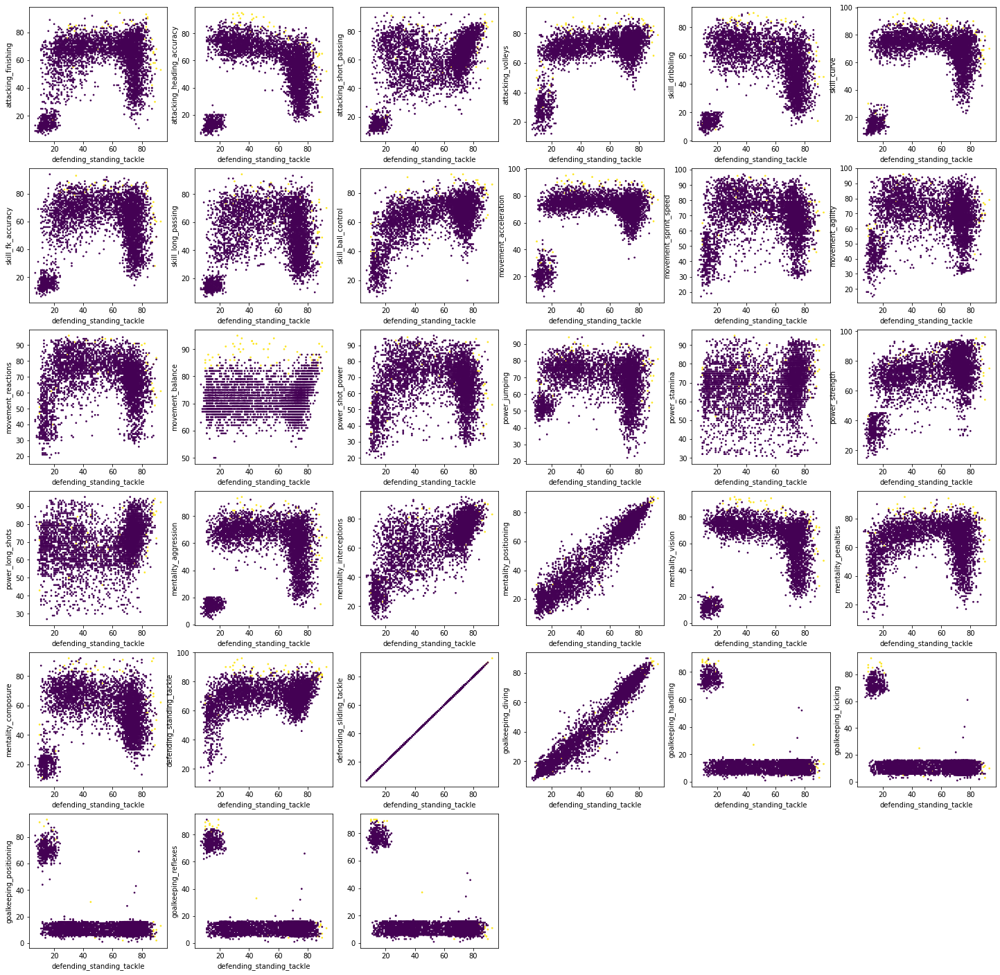

In [ ]:
bool_crack=df_n["overall"] > 85

plt.figure(figsize=(25,25))

for i,skill in enumerate(skills_ratings):
    skill_1 = skills_ratings[skill_i]
    skill_2 = skills_ratings[i]
    plt.xlabel(skill_1)
    plt.ylabel(skill_2)
    plt.subplot(6,6,i+1)
    plt.scatter(df_skills[skill_1], y=df_skills[skill_2],s=3,c=bool_crack)
    
plt.show()

In [ ]:
#Elejimos dos variables, para esto elejimos dos números entre 0 y  de n_skills-1

skill_1= 'skill_dribbling'
skill_2= 'mentality_vision'

In [ ]:
graf1 = go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],
                           mode='markers',
                        text=df_n.loc[:,'club_name'], #'Height', 'Weight', 'Club', 'Age', 'Name','Position'
                           marker=dict(
                                size=5)
                           )

crack =go.Scatter(x=df_skills.loc[bool_crack,skill_1], y=df_skills.loc[bool_crack,skill_2],name='Top players',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[graf1,crack]

layout = go.Layout(title="Visualización de la base de a dos variables numéricas",titlefont=dict(size=20),
                xaxis=dict(title=skill_1),
                yaxis=dict(title=skill_2),
                autosize=False, width=700,height=700)

fig = go.Figure(data=data, layout=layout)


In [ ]:
fig.show(renderer="colab")

# 3.-Clustering-con-Kmeans

ES necesario definirle la cantidad de grupos/clusters (n_clusters), es un hiperparámetro del algoritmo. 


In [ ]:
# Número de clusters buscado
n_clust = 5

km = KMeans(n_clusters=n_clust)
km.fit(df_skills) #utiliza todas las habilidades: 34 dimensiones

# Recuperacion de etiquetas
clusters = km.labels_
print('Suma de los cuadrados de las distancias al cluster=Inertia= ', km.inertia_)

Suma de los cuadrados de las distancias al cluster=Inertia=  10156257.923035769


**Elección de la cantidad de grupos/clusters**

Una forma de seleccionar la cantidad más adecuada de clusters es probar varias cantidades y usar el criterio del codo: "elbow method", utilizando una medida de ajuste que puede ser Inertia.

Text(0.5, 1.0, 'Inertia of k-Means versus number of clusters')

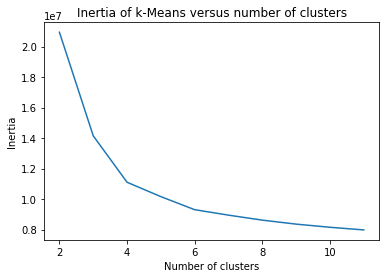

In [ ]:
#Prueba: para elegir el hiperparámetro n_clusters, variando de 2 a 11 clusters
scores = [KMeans(n_clusters=i).fit(df_skills).inertia_ for i in range(2,12)]

plt.plot(np.arange(2, 12), scores)
plt.xlabel('Number of clusters')
plt.ylabel("Inertia")
plt.title("Inertia of k-Means versus number of clusters")

**Graficamos el resultado de agrupar a los jugadores usando kmedias con la cantidad de clases elegida: Visualizamos de a dos variables por vez**

In [ ]:
bool_crack=df_n["overall"] > 85
bool_no_crack=df_n["overall"]<86

#Eligo dos números entre 0 y  de n_skills-1
skill_1= 'defending_standing_tackle'
skill_2= 'mentality_penalties'

In [ ]:
kmean_clusters = go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],
                           mode='markers',
                        text=df_n.loc[:,'short_name'],
                           marker=dict(
                                size=5,
                                color = clusters.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills.loc[bool_crack,skill_1], y=df_skills.loc[bool_crack,skill_2],name='Ckacks!!',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[kmean_clusters,crack]

layout = go.Layout(title="Clustering K means ",titlefont=dict(size=20),
                xaxis=dict(title=skill_1),
                yaxis=dict(title=skill_2),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

In [ ]:
#En Colab:
fig.show(renderer="colab")

**Graficamos el mismo resultado, pero utilizando t-SNE para reducir las 34 dimensiones a 2.**

In [ ]:
tsne = manifold.TSNE(n_components=2, verbose=1,perplexity=30, n_iter=1000)
df_skills_tsne = tsne.fit_transform(df_skills)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 4512 samples in 0.026s...
[t-SNE] Computed neighbors for 4512 samples in 1.079s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4512
[t-SNE] Computed conditional probabilities for sample 2000 / 4512
[t-SNE] Computed conditional probabilities for sample 3000 / 4512
[t-SNE] Computed conditional probabilities for sample 4000 / 4512
[t-SNE] Computed conditional probabilities for sample 4512 / 4512
[t-SNE] Mean sigma: 12.235446
[t-SNE] KL divergence after 250 iterations with early exaggeration: 75.538177
[t-SNE] KL divergence after 1000 iterations: 1.799748


In [ ]:
kmean_clusters = go.Scatter(x=df_skills_tsne[:,0], y=df_skills_tsne[:,1],
                           mode='markers',
                        text=df_n.loc[:,'short_name'],
                           marker=dict(
                                size=5,
                                color = clusters.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills_tsne[bool_crack,0], y=df_skills_tsne[bool_crack,1],name='Ckacks!!',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[kmean_clusters,crack]

layout = go.Layout(title="K means - t-SNE",titlefont=dict(size=20),
                xaxis=dict(title='componente_1'),
                yaxis=dict(title='componente_2'),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

In [ ]:
#En Colab:
fig.show(renderer="colab")

In [ ]:
df_clusters=df_n.copy()
df_clusters['kmeans'] = km.labels_ #clusters
print('Kmeans encontró: ', max(km.labels_)+1, 'clusters, nosotros forzamos la cantidad')

Kmeans encontró:  5 clusters, nosotros forzamos la cantidad


**EVALUACIÓN**

**EJERCICIO: Análisis exploratorio de los clusters, usando las clases asignadas por kmeans** 
- Cantidad de observaciones por Cluster
- Análisis descriptivo separando por Cluster
- Tabla de contingencia alguna categórica vs clusters
- Silohuette?


In [ ]:
#Observaciones por cluster
df_clusters["kmeans"].value_counts()


0    1625
3    1003
2     907
4     533
1     444
Name: kmeans, dtype: int64

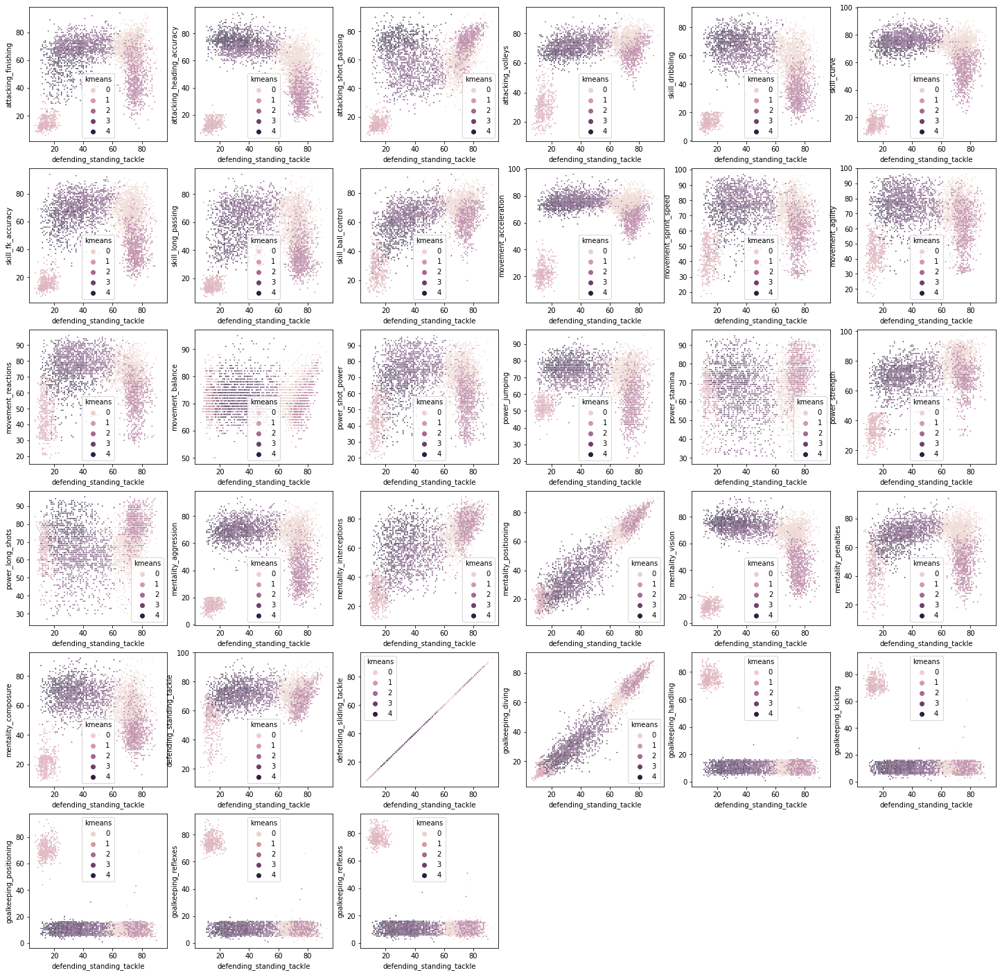

In [ ]:
bool_crack=df_n["overall"] > 85

plt.figure(figsize=(25,25))

for i,skill in enumerate(skills_ratings):
    skill_1 = skills_ratings[skill_i]
    skill_2 = skills_ratings[i]
    plt.xlabel(skill_1)
    plt.ylabel(skill_2)
    plt.subplot(6,6,i+1)
    sns.scatterplot(x = df_clusters[skill_1], y=df_clusters[skill_2],s=3,c=bool_crack, hue = df_clusters['kmeans'], cmap = 'hsv_r')
    
plt.show()

Para n_clusters = 2 El silhouette_score promedio es : 0.6413157990914239
Para n_clusters = 3 El silhouette_score promedio es : 0.3368735183485735
Para n_clusters = 4 El silhouette_score promedio es : 0.30988045957867183
Para n_clusters = 5 El silhouette_score promedio es : 0.2774150713305208
Para n_clusters = 6 El silhouette_score promedio es : 0.23810817661502381


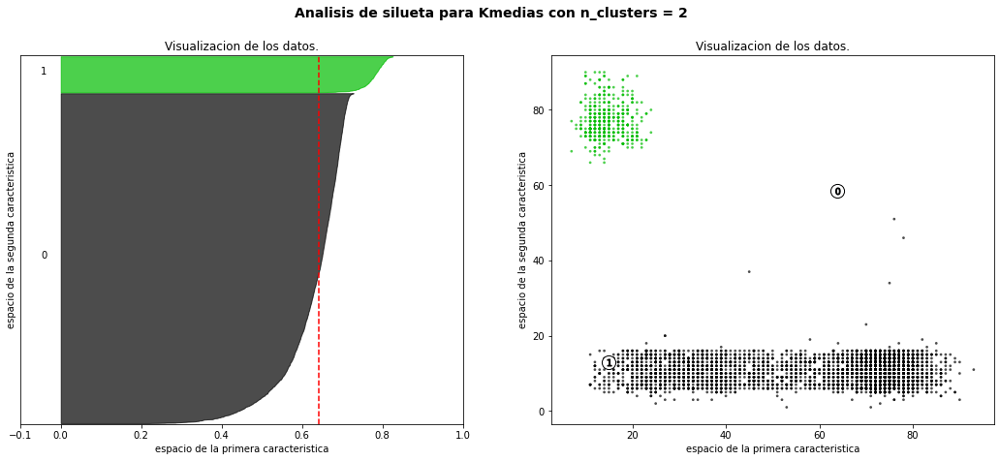

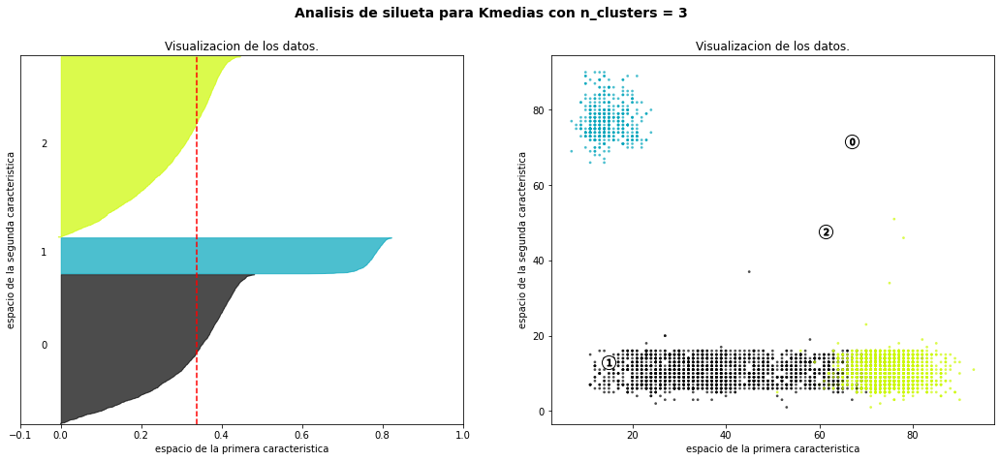

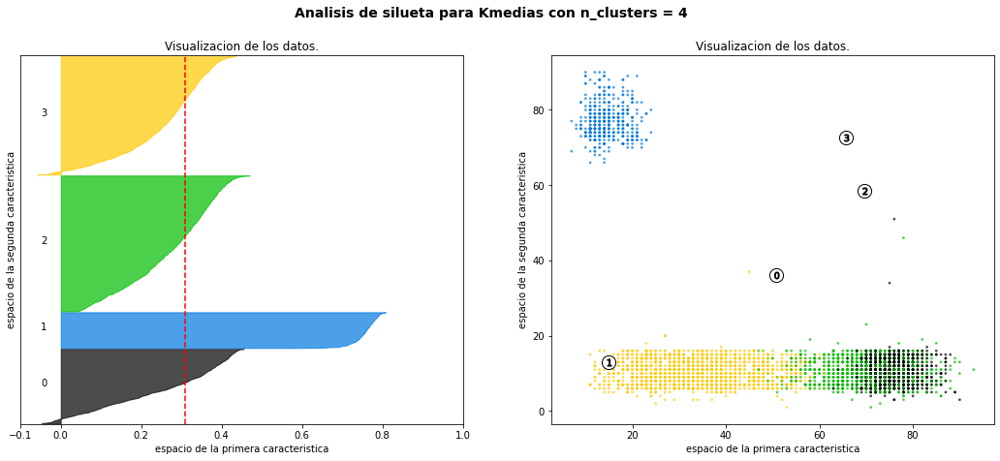

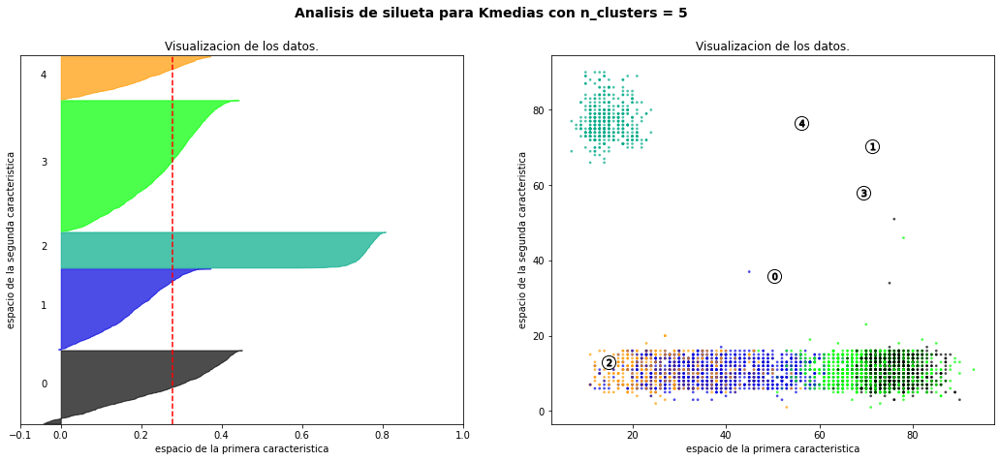

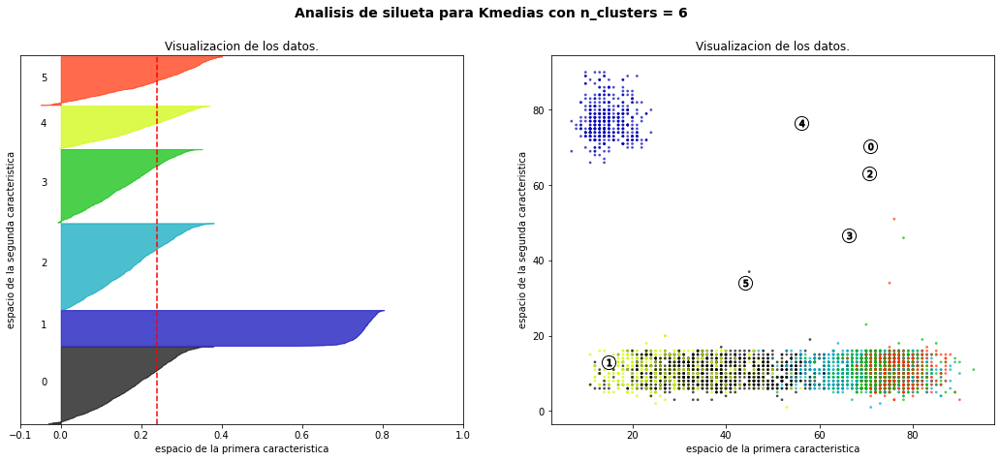

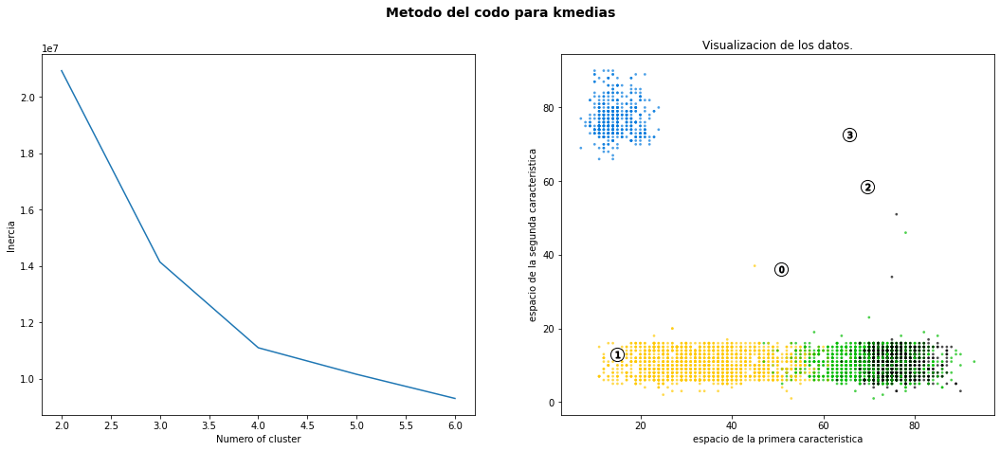

In [ ]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

range_n_clusters = [2,3, 4, 5, 6]
sse ={}
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(df_skills) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(df_skills)
    sse[n_clusters] = clusterer.inertia_

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(df_skills, cluster_labels)
    print("Para n_clusters =", n_clusters,
          "El silhouette_score promedio es :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_skills, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Visualizacion de los datos.")
    ax1.set_xlabel("espacio de la primera caracteristica")
    ax1.set_ylabel("espacio de la segunda caracteristica")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(df_skills[skill_1], df_skills[skill_2], marker='.', s=30, lw=0, alpha=0.7,
                c = colors,edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("Visualizacion de los datos.")
    ax2.set_xlabel("espacio de la primera caracteristica")
    ax2.set_ylabel("espacio de la segunda caracteristica")

    plt.suptitle(("Analisis de silueta para Kmedias "
                  "con n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    #plt.savefig("kmeans_%d" % n_clusters, dpi=300)

plt.show()

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18, 7)
plt.suptitle(("Metodo del codo para kmedias "),
                 fontsize=14, fontweight='bold')
ax1.plot(list(sse.keys()), list(sse.values()))
ax1.set_xlabel("Numero of cluster")
ax1.set_ylabel("Inercia")

clusterer = KMeans(n_clusters=4, random_state=10)
cluster_labels = clusterer.fit_predict(df_skills)
    
colors = cm.nipy_spectral(cluster_labels.astype(float) / 4)
ax2.scatter(df_skills[skill_1], df_skills[skill_2], marker='.', s=30, lw=0, alpha=0.7, c = colors, edgecolor='k')

# Labeling the clusters
centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
ax2.scatter(centers[:, 0], centers[:, 1], marker='o',c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centers):
    ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,s=50, edgecolor='k')

ax2.set_title("Visualizacion de los datos.")
ax2.set_xlabel("espacio de la primera caracteristica")
ax2.set_ylabel("espacio de la segunda caracteristica")

#plt.savefig("kmeans_elbow", dpi=300)
plt.show()

**El análisis de silueta con distintos clusters no indica valores muy altos, y además se observan valores negativos, con lo cual vemos dificultades para diferenciar correctamente los elementos de un cluster respecto de otros. A medida que aumentamos la cantidad de clusters, este indicador empeora: Hay que probar que pasa si sacamos a los arqueros.**

# 4.-Clustering-Mean-Shift 

- NO es necesario definirle la cantidad de grupos/clusters
- NO es escalable, computacionalmente es muy pesado. Cada dato tienen un proceso iterativo en donde en cada iteración considera los vecinos a menos de un radio de distancia.
- Hipeparámetros: radio/bandwith (de cobertura para cálculo de media). (Probar con varios)

















































































In [ ]:
ms = MeanShift(bandwidth=2, bin_seeding=True)

ms.fit(df_skills)

clusters2 = ms.labels_
cluster_centers = ms.cluster_centers_

labels_unique = np.unique(clusters2)
n_clusters_ = len(labels_unique)

print("Cantidad de clusters encontrados por Mean Shift : %d" % n_clusters_)

Cantidad de clusters encontrados por Mean Shift : 3


Graficamos los resultados:

In [ ]:
bool_crack=df_n["overall"] > 85
bool_no_crack=df_n["overall"]<86

#Eligo dos números entre 0 y  de n_skills-1
# skill_1=skills_ratings[5]
# skill_2=skills_ratings[14]

In [ ]:
MeanShift_clusters = go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],
                           mode='markers',
                        text=df_n.loc[:,'short_name'],
                           marker=dict(
                                size=5,
                                color = clusters2.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills.loc[bool_crack,skill_1], y=df_skills.loc[bool_crack,skill_2],name='Top players',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[MeanShift_clusters,crack]

layout = go.Layout(title="Mean Shift",titlefont=dict(size=20),
                xaxis=dict(title=skill_1),
                yaxis=dict(title=skill_2),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

In [ ]:
#En Colab
fig.show(renderer="colab")

**Graficamos los mismos resultados, pero proyectados con t-SNE**

In [ ]:
MeanShift_clusters = go.Scatter(x=df_skills_tsne[:,0], y=df_skills_tsne[:,1],
                           mode='markers',
                        text=df_n.loc[:,'short_name'],
                           marker=dict(
                                size=5,
                                color = clusters2.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills_tsne[bool_crack,0], y=df_skills_tsne[bool_crack,1],name='Ckacks!!',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[MeanShift_clusters,crack]

layout = go.Layout(title="Mean Shift - t-SNE",titlefont=dict(size=20),
                xaxis=dict(title='componente_1'),
                yaxis=dict(title='componente_2'),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

In [ ]:
#En Colab
fig.show(renderer="colab")

In [ ]:
df_clusters['MeanShift'] = ms.labels_ #clusters2
print('Kmeans encontró: ', max(km.labels_)+1, 'clusters, nosotros lo forzamos')
print('Mean shift encontró ', max(ms.labels_)+1, 'clusters, según los hiperparámetros elegidos')

Kmeans encontró:  5 clusters, nosotros lo forzamos
Mean shift encontró  3 clusters, según los hiperparámetros elegidos


**EVALUACIÓN**

**EJERCICIO EN GRUPO: Análisis exploratorio de los clusters, usando las clases asignadas por MeanShift** 

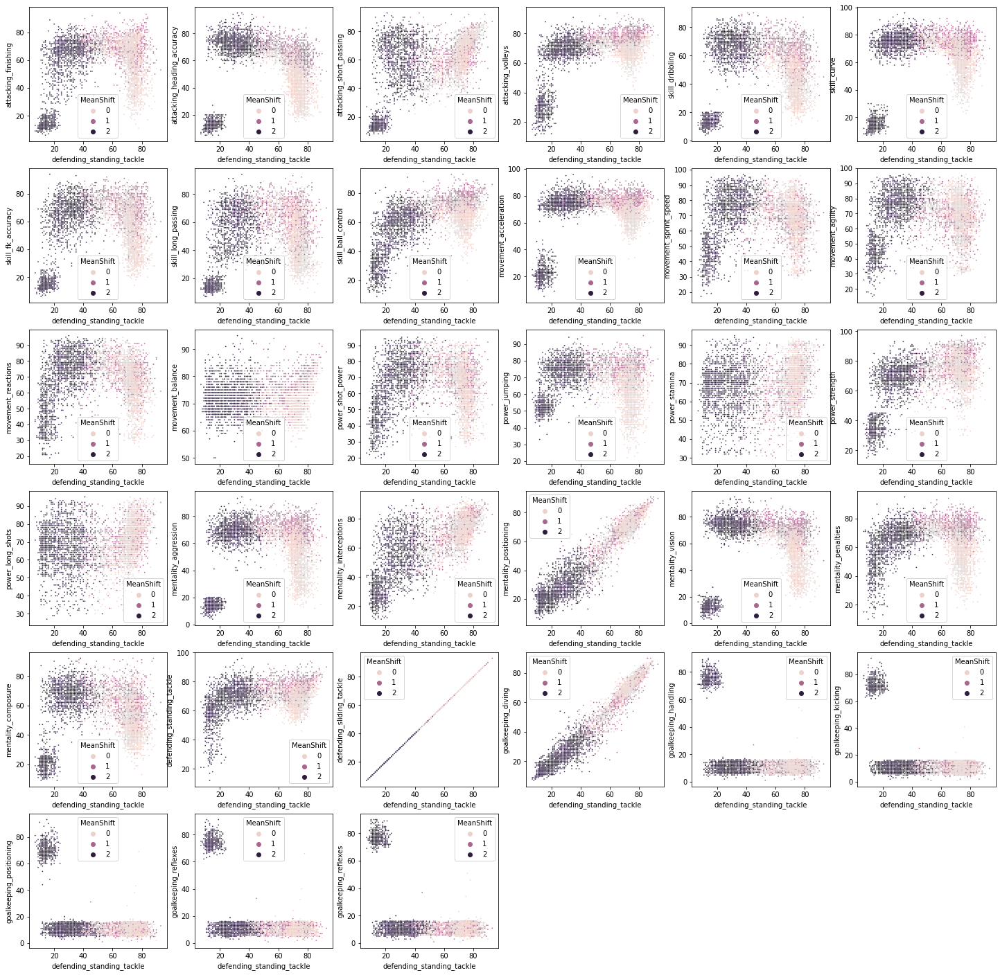

In [ ]:
bool_crack=df_n["overall"] > 85

plt.figure(figsize=(25,25))

for i,skill in enumerate(skills_ratings):
    skill_1 = skills_ratings[skill_i]
    skill_2 = skills_ratings[i]
    plt.xlabel(skill_1)
    plt.ylabel(skill_2)
    plt.subplot(6,6,i+1)
    sns.scatterplot(x = df_clusters[skill_1], y=df_clusters[skill_2],s=3,c=bool_crack, hue = df_clusters['MeanShift'], cmap = 'hsv_r')
    
plt.show()


In [ ]:
#Observaciones por cluster
df_clusters["MeanShift"].value_counts()


0    1975
2    1599
1     938
Name: MeanShift, dtype: int64

In [ ]:
silhouette_avg = silhouette_score(df_skills, ms.labels_)
print("El silhouette_score promedio es :", silhouette_avg)

El silhouette_score promedio es : 0.04524089402228348


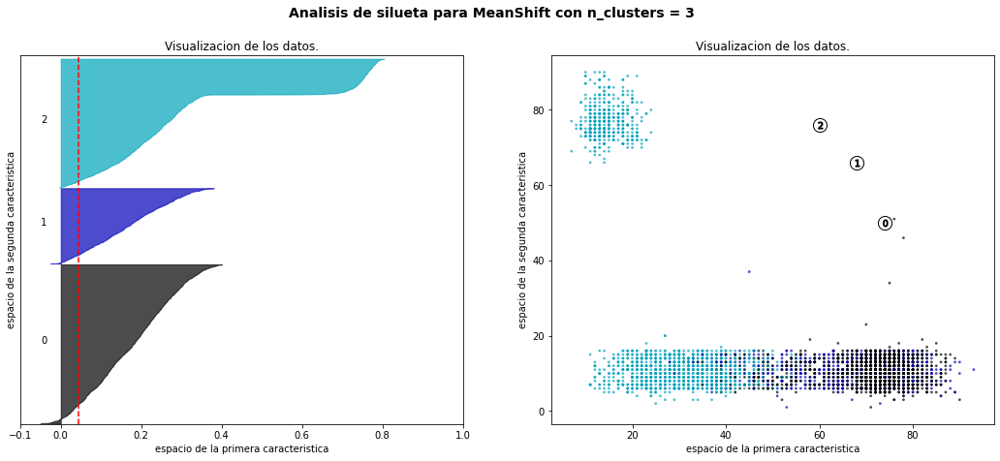

In [ ]:
# Create a subplot with 1 row and 2 columns
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18, 7)

# The 1st subplot is the silhouette plot
# The silhouette coefficient can range from -1, 1 but in this example all
# lie within [-0.1, 1]
ax1.set_xlim([-0.1, 1])
# The (n_clusters+1)*10 is for inserting blank space between silhouette
# plots of individual clusters, to demarcate them clearly.
ax1.set_ylim([0, len(df_skills) + (n_clusters + 1) * 10])

y_lower = 10
for i in range(max(ms.labels_)+1):
    # Aggregate the silhouette scores for samples belonging to
    # cluster i, and sort them
    ith_cluster_silhouette_values = \
        sample_silhouette_values[ms.labels_ == i]

    ith_cluster_silhouette_values.sort()

    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i

    color = cm.nipy_spectral(float(i) / n_clusters)
    ax1.fill_betweenx(np.arange(y_lower, y_upper),
                      0, ith_cluster_silhouette_values,
                      facecolor=color, edgecolor=color, alpha=0.7)

    # Label the silhouette plots with their cluster numbers at the middle
    ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

    # Compute the new y_lower for next plot
    y_lower = y_upper + 10  # 10 for the 0 samples

ax1.set_title("Visualizacion de los datos.")
ax1.set_xlabel("espacio de la primera caracteristica")
ax1.set_ylabel("espacio de la segunda caracteristica")

# The vertical line for average silhouette score of all the values
ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

ax1.set_yticks([])  # Clear the yaxis labels / ticks
ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


# 2nd Plot showing the actual clusters formed
colors = cm.nipy_spectral(ms.labels_.astype(float) / n_clusters)
ax2.scatter(df_skills[skill_1], df_skills[skill_2], marker='.', s=30, lw=0, alpha=0.7,
            c = colors,edgecolor='k')

# Labeling the clusters
centers = ms.cluster_centers_
# Draw white circles at cluster centers
ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
            c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centers):
    ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                s=50, edgecolor='k')

ax2.set_title("Visualizacion de los datos.")
ax2.set_xlabel("espacio de la primera caracteristica")
ax2.set_ylabel("espacio de la segunda caracteristica")

plt.suptitle(("Analisis de silueta para MeanShift "
              "con n_clusters = %d" % (max(ms.labels_)+1)),
              fontsize=14, fontweight='bold')
#plt.savefig("kmeans_%d" % n_clusters, dpi=300)

plt.show()

**La prueba de la silueta sigue dando valores bajos, y desbalanceados entre grupos, además de haber algunos valores negativos. Ahora vemos que agrupamientos se pueden hacer excluyendo los arqueros**

# 5.-Clustering-con-Kmeans-sin-arqueros

In [ ]:
df_n.player_positions

0       RW, ST, CF
1           ST, LW
2               GK
3               ST
4          LW, CAM
           ...    
4507        RM, RB
4508            RM
4509            CM
4510            GK
4511           CDM
Name: player_positions, Length: 4512, dtype: object

In [ ]:
n=10000
df_n=df.loc[:n]
df_n=df_n[(df_n["player_positions"]!='GK')&(df_n['overall']>69)]


df_skills=df_n[skills_ratings]


In [ ]:
# Número de clusters buscado
n_clust = 5

km = KMeans(n_clusters=n_clust)
km.fit(df_skills)

# Recuperacion de etiquetas
clusters = km.labels_

In [ ]:
df_n['Kmeans_SA'] = clusters

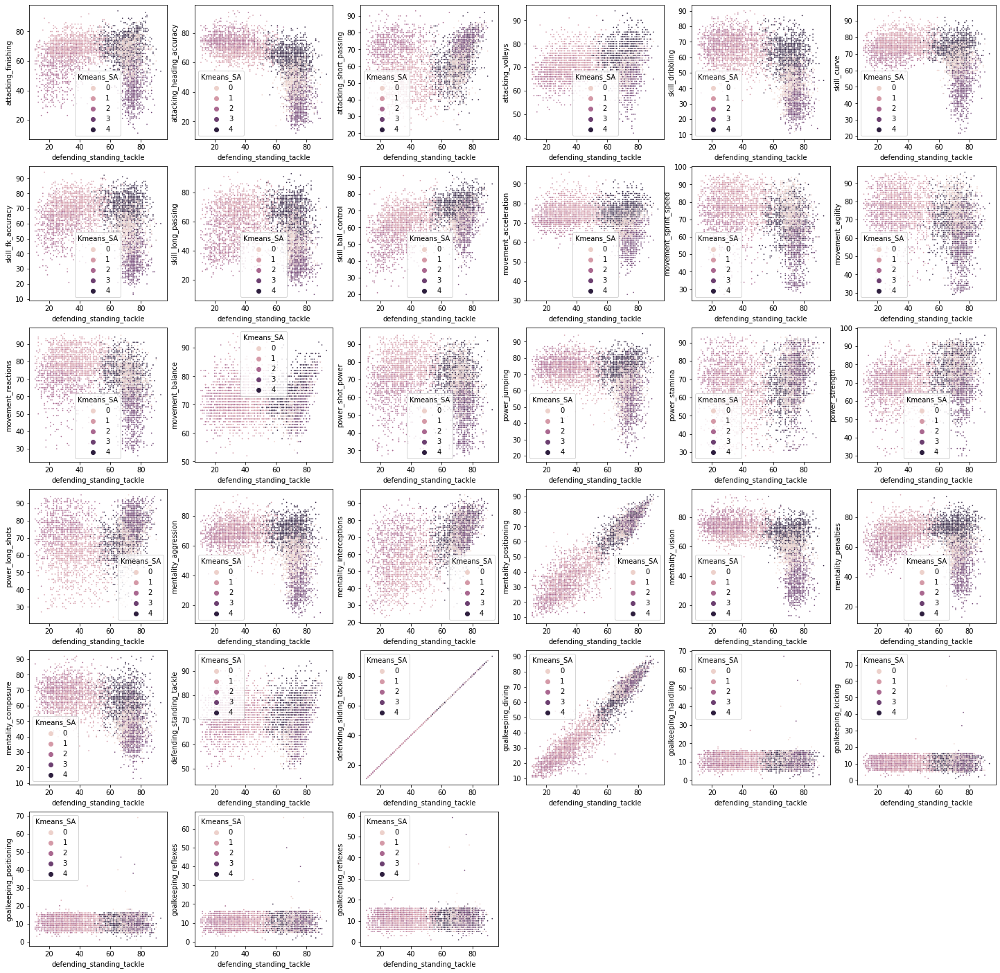

In [ ]:
bool_crack=df_n["overall"] > 85

plt.figure(figsize=(25,25))

for i,skill in enumerate(skills_ratings):
    skill_1 = skills_ratings[skill_i]
    skill_2 = skills_ratings[i]
    plt.xlabel(skill_1)
    plt.ylabel(skill_2)
    plt.subplot(6,6,i+1)
    sns.scatterplot(x = df_n[skill_1], y=df_n[skill_2],s=3,c=bool_crack, hue = df_n['Kmeans_SA'], cmap = 'hsv_r')
    
plt.show()


In [ ]:
#data=[]
bool_crack=df_n["overall"] > 85
bool_no_crack=df_n["overall"]<86

#Eligo dos números entre 0 y  de n_skills-1
skill_1= 'defending_standing_tackle'
skill_2= 'attacking_finishing'

In [ ]:
kmean_clusters = go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],
                           mode='markers',
                        text=df_n.loc[:,'short_name'],
                           marker=dict(
                                size=5,
                                color = clusters.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills.loc[bool_crack,skill_1], y=df_skills.loc[bool_crack,skill_2],name='Top players',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[kmean_clusters,crack]

layout = go.Layout(title="Clustering K means ",titlefont=dict(size=20),
                xaxis=dict(title=skill_1),
                yaxis=dict(title=skill_2),
                autosize=False, width=1000,height=1000)

fig = go.Figure(data=data, layout=layout)

In [ ]:
#En Colab
fig.show(renderer="colab")

In [ ]:
# Reduccion de dimensionalidad con t-SNE
tsne = manifold.TSNE(n_components=2, verbose=1,perplexity=30, n_iter=1000)
df_skills_tsne = tsne.fit_transform(df_skills)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 4869 samples in 0.028s...
[t-SNE] Computed neighbors for 4869 samples in 1.499s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4869
[t-SNE] Computed conditional probabilities for sample 2000 / 4869
[t-SNE] Computed conditional probabilities for sample 3000 / 4869
[t-SNE] Computed conditional probabilities for sample 4000 / 4869
[t-SNE] Computed conditional probabilities for sample 4869 / 4869
[t-SNE] Mean sigma: 11.844459
[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.496124
[t-SNE] KL divergence after 1000 iterations: 1.928897


In [ ]:
kmean_clusters = go.Scatter(x=df_skills_tsne[:,0], y=df_skills_tsne[:,1],
                           mode='markers',
                        text=df_n.loc[:,'short_name'],
                           marker=dict(
                                size=5,
                                color = clusters.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills_tsne[bool_crack,0], y=df_skills_tsne[bool_crack,1],name='Ckacks!!',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[kmean_clusters,crack]

layout = go.Layout(title="K means - t-SNE",titlefont=dict(size=20),
                xaxis=dict(title='componente_1'),
                yaxis=dict(title='componente_2'),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

In [ ]:
#En Colab
fig.show(renderer="colab")

Para n_clusters = 2 El silhouette_score promedio es : 0.28225596248959156
Para n_clusters = 3 El silhouette_score promedio es : 0.2556874995511751
Para n_clusters = 4 El silhouette_score promedio es : 0.22067305269674817
Para n_clusters = 5 El silhouette_score promedio es : 0.1805871553232471
Para n_clusters = 6 El silhouette_score promedio es : 0.1593550196151605


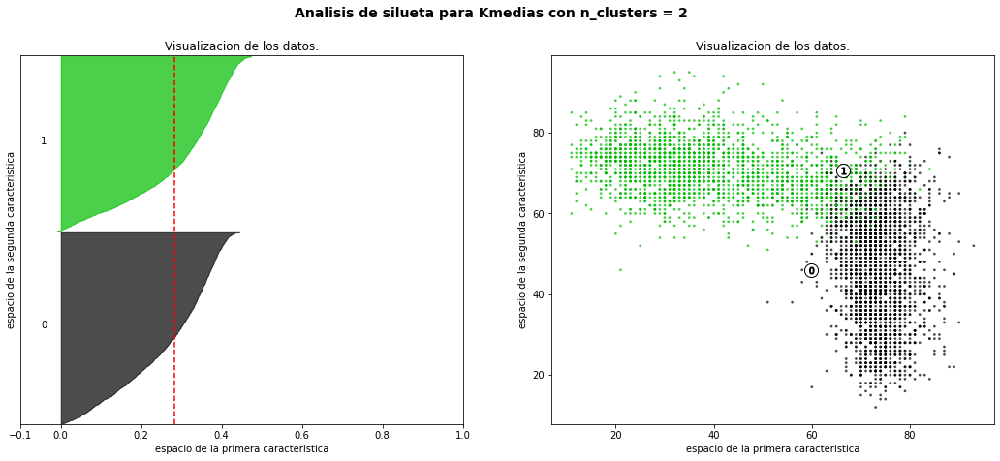

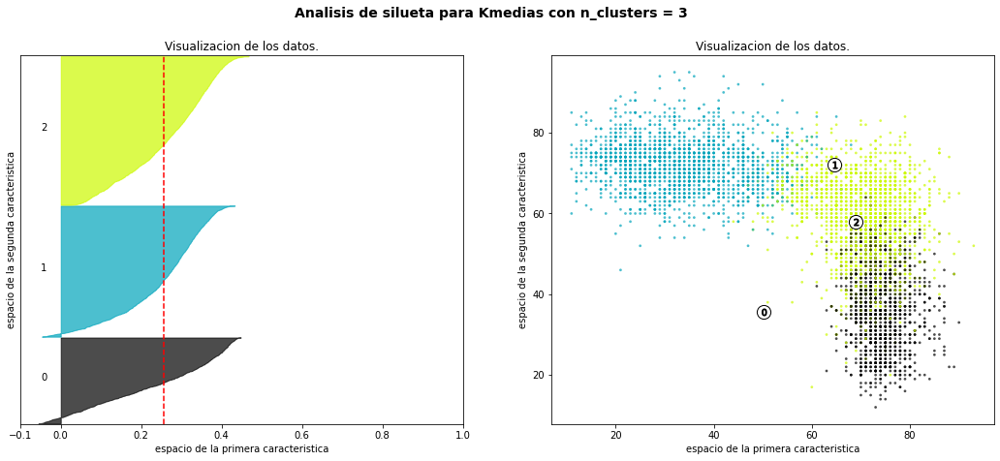

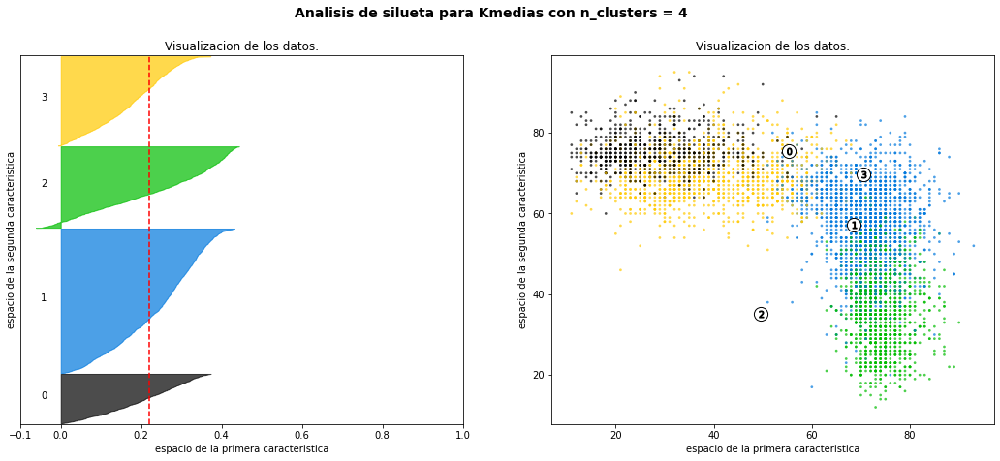

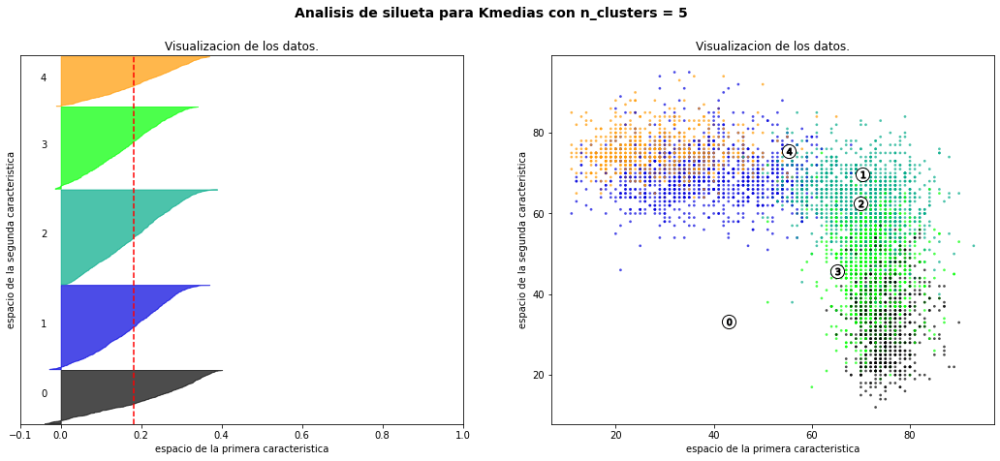

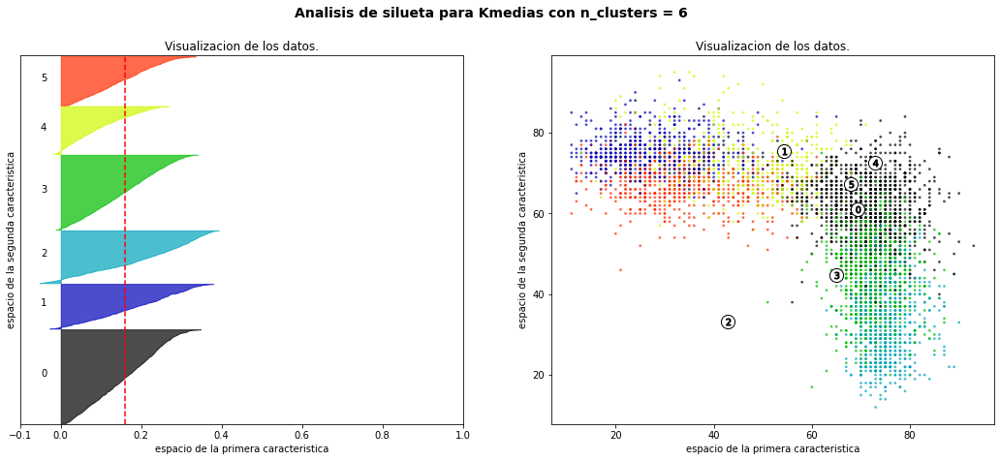

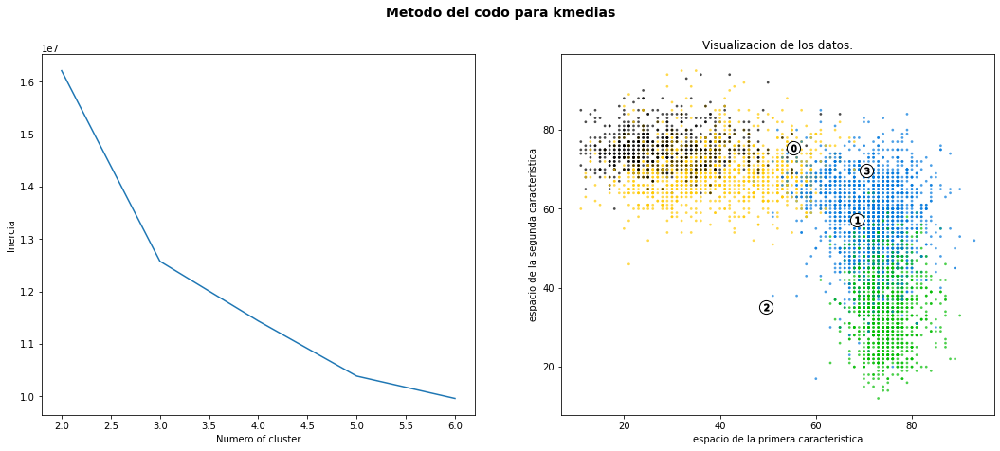

In [ ]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

range_n_clusters = [2,3, 4, 5, 6]
sse ={}
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(df_skills) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(df_skills)
    sse[n_clusters] = clusterer.inertia_

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(df_skills, cluster_labels)
    print("Para n_clusters =", n_clusters,
          "El silhouette_score promedio es :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_skills, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Visualizacion de los datos.")
    ax1.set_xlabel("espacio de la primera caracteristica")
    ax1.set_ylabel("espacio de la segunda caracteristica")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(df_skills[skill_1], df_skills[skill_2], marker='.', s=30, lw=0, alpha=0.7,
                c = colors,edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("Visualizacion de los datos.")
    ax2.set_xlabel("espacio de la primera caracteristica")
    ax2.set_ylabel("espacio de la segunda caracteristica")

    plt.suptitle(("Analisis de silueta para Kmedias "
                  "con n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    #plt.savefig("kmeans_%d" % n_clusters, dpi=300)

plt.show()

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18, 7)
plt.suptitle(("Metodo del codo para kmedias "),
                 fontsize=14, fontweight='bold')
ax1.plot(list(sse.keys()), list(sse.values()))
ax1.set_xlabel("Numero of cluster")
ax1.set_ylabel("Inercia")

clusterer = KMeans(n_clusters=4, random_state=10)
cluster_labels = clusterer.fit_predict(df_skills)
    
colors = cm.nipy_spectral(cluster_labels.astype(float) / 4)
ax2.scatter(df_skills[skill_1], df_skills[skill_2], marker='.', s=30, lw=0, alpha=0.7, c = colors, edgecolor='k')

# Labeling the clusters
centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
ax2.scatter(centers[:, 0], centers[:, 1], marker='o',c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centers):
    ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,s=50, edgecolor='k')

ax2.set_title("Visualizacion de los datos.")
ax2.set_xlabel("espacio de la primera caracteristica")
ax2.set_ylabel("espacio de la segunda caracteristica")

#plt.savefig("kmeans_elbow", dpi=300)
plt.show()

**A diferencia de las pruebas anteriores (dataset completo), aquí la prueba de silueta arroja valores más uniformes para cada cluster. Veamos cómo se ve con MeanShift**

# 6.-Clustering-Mean-Shift-sin-arqueros 

In [ ]:
ms = MeanShift()
ms.fit(df_skills)

clusters2 = ms.labels_
cluster_centers = ms.cluster_centers_

labels_unique = np.unique(clusters2)
n_clusters_ = len(labels_unique)

print("Numero de clusters encontrado por Mean Shift : %d" % n_clusters_)

Numero de clusters encontrado por Mean Shift : 3


In [ ]:
df_n['MeanShift_SA'] = ms.labels_

In [ ]:
#Observaciones por cluster
df_n["MeanShift_SA"].value_counts()

0    4781
1      87
2       1
Name: MeanShift_SA, dtype: int64

In [ ]:
bool_crack=df_n["overall"] > 85
bool_no_crack=df_n["overall"]<86

#Eligo dos números entre 0 y  de n_skills-1
skill_1='defending_standing_tackle'
skill_2= 'attacking_finishing'

In [ ]:
MeanShift_clusters = go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],
                           mode='markers',
                        text=df_n.loc[:,'short_name'],
                           marker=dict(
                                size=5,
                                color = clusters2.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills.loc[bool_crack,skill_1], y=df_skills.loc[bool_crack,skill_2],name='Top players',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[MeanShift_clusters,crack]

layout = go.Layout(title="Mean Shift",titlefont=dict(size=20),
                xaxis=dict(title=skill_1),
                yaxis=dict(title=skill_2),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

In [ ]:
#En Colab
fig.show(renderer="colab")

In [ ]:
# Con t-SNE
MeanShift_clusters = go.Scatter(x=df_skills_tsne[:,0], y=df_skills_tsne[:,1],
                           mode='markers',
                        text=df_n.loc[:,'short_name'],
                           marker=dict(
                                size=5,
                                color = clusters2.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills_tsne[bool_crack,0], y=df_skills_tsne[bool_crack,1],name='Ckacks!!',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[MeanShift_clusters,crack]

layout = go.Layout(title="Mean Shift - t-SNE",titlefont=dict(size=20),
                xaxis=dict(title='componente_1'),
                yaxis=dict(title='componente_2'),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

In [ ]:
#En Colab
fig.show(renderer="colab")

**A MeanShift le costó diferenciar clusters, prácticamente metió a todas las observaciones en el mismo**

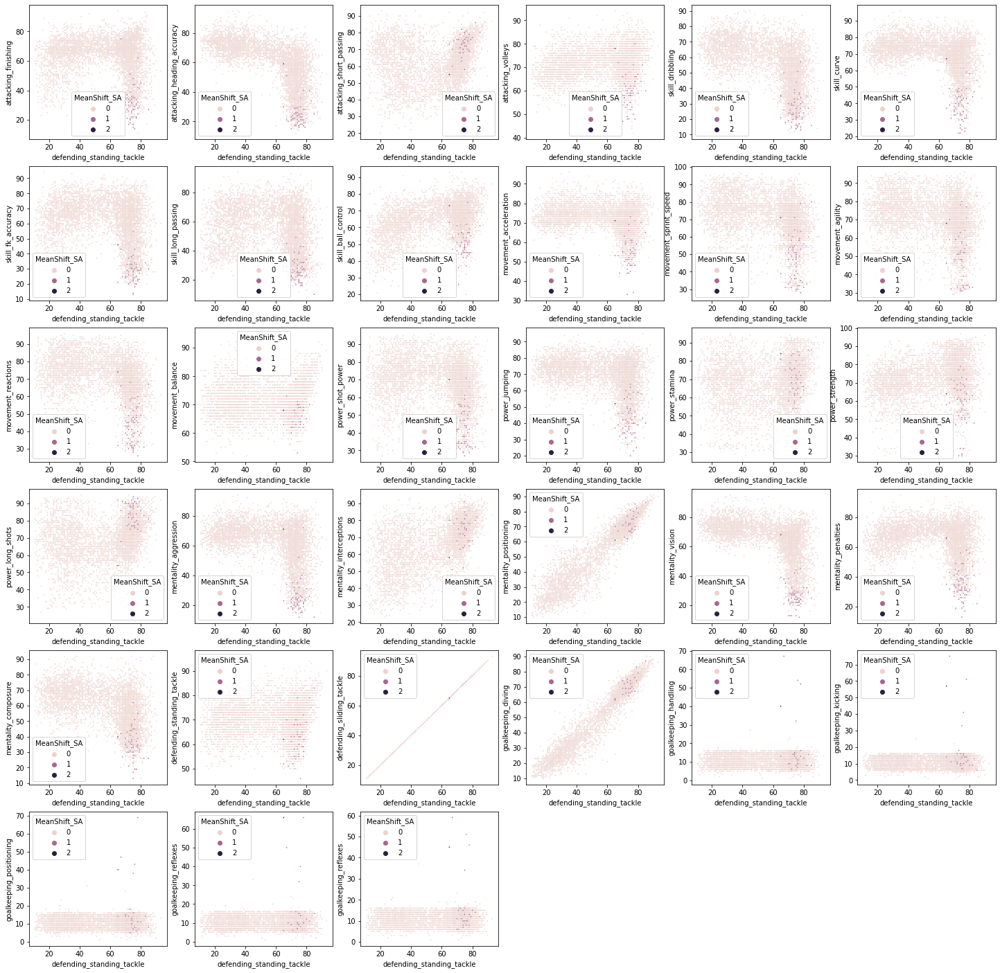

In [ ]:
bool_crack=df_n["overall"] > 85

plt.figure(figsize=(25,25))

for i,skill in enumerate(skills_ratings):
    skill_1 = skills_ratings[skill_i]
    skill_2 = skills_ratings[i]
    plt.xlabel(skill_1)
    plt.ylabel(skill_2)
    plt.subplot(6,6,i+1)
    sns.scatterplot(x = df_n[skill_1], y=df_n[skill_2],s=3,c=bool_crack, hue = df_n['MeanShift_SA'], cmap = 'hsv_r')
    
plt.show()


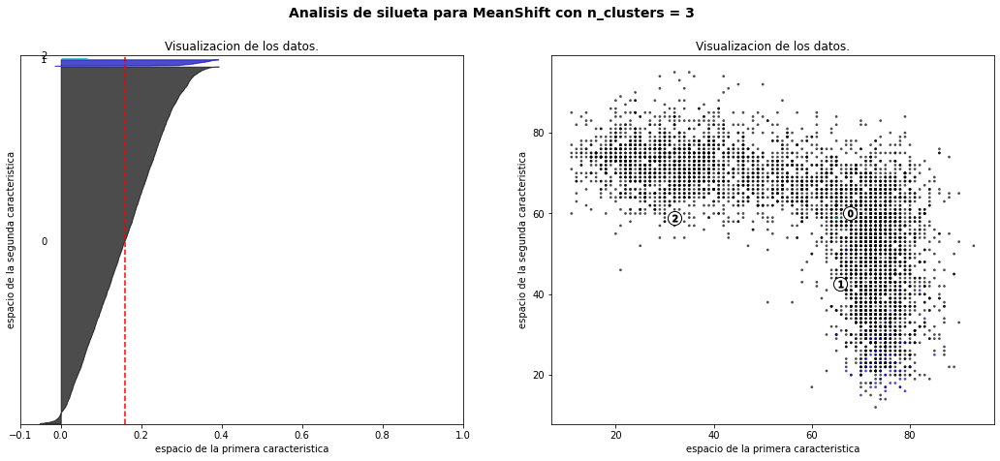

In [ ]:
# Create a subplot with 1 row and 2 columns
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18, 7)

# The 1st subplot is the silhouette plot
# The silhouette coefficient can range from -1, 1 but in this example all
# lie within [-0.1, 1]
ax1.set_xlim([-0.1, 1])
# The (n_clusters+1)*10 is for inserting blank space between silhouette
# plots of individual clusters, to demarcate them clearly.
ax1.set_ylim([0, len(df_skills) + (n_clusters + 1) * 10])

y_lower = 10
for i in range(max(ms.labels_)+1):
    # Aggregate the silhouette scores for samples belonging to
    # cluster i, and sort them
    ith_cluster_silhouette_values = \
        sample_silhouette_values[ms.labels_ == i]

    ith_cluster_silhouette_values.sort()

    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i

    color = cm.nipy_spectral(float(i) / n_clusters)
    ax1.fill_betweenx(np.arange(y_lower, y_upper),
                      0, ith_cluster_silhouette_values,
                      facecolor=color, edgecolor=color, alpha=0.7)

    # Label the silhouette plots with their cluster numbers at the middle
    ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

    # Compute the new y_lower for next plot
    y_lower = y_upper + 10  # 10 for the 0 samples

ax1.set_title("Visualizacion de los datos.")
ax1.set_xlabel("espacio de la primera caracteristica")
ax1.set_ylabel("espacio de la segunda caracteristica")

# The vertical line for average silhouette score of all the values
ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

ax1.set_yticks([])  # Clear the yaxis labels / ticks
ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


# 2nd Plot showing the actual clusters formed
colors = cm.nipy_spectral(ms.labels_.astype(float) / n_clusters)
ax2.scatter(df_skills[skill_1], df_skills[skill_2], marker='.', s=30, lw=0, alpha=0.7,
            c = colors,edgecolor='k')

# Labeling the clusters
centers = ms.cluster_centers_
# Draw white circles at cluster centers
ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
            c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centers):
    ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                s=50, edgecolor='k')

ax2.set_title("Visualizacion de los datos.")
ax2.set_xlabel("espacio de la primera caracteristica")
ax2.set_ylabel("espacio de la segunda caracteristica")

plt.suptitle(("Analisis de silueta para MeanShift "
              "con n_clusters = %d" % (max(ms.labels_)+1)),
              fontsize=14, fontweight='bold')
#plt.savefig("kmeans_%d" % n_clusters, dpi=300)

plt.show()

**La prueba de silueta da peor que con KMeans**

# 7.-Clustering-con-Agglomerative

In [ ]:
n=10000
df_n=df.loc[:n] #los primeros n
df_n=df_n[(df_n['overall']>70)] # mejores jugadores


df_skills=df_n[skills_ratings]

In [ ]:
# Número de clusters buscado
n_clust = 5

clustering = AgglomerativeClustering(n_clusters=n_clust, linkage='average', affinity='cityblock')
clustering.fit(df_skills)

clusters = c.labels_
#cluster_centers = clustering.cluster_centers_

labels_unique = np.unique(clusters)
n_clusters_ = len(labels_unique)

In [ ]:
bool_crack=df_n["overall"] > 85
bool_no_crack=df_n["overall"]<86

In [ ]:
df_n['Agglomerative'] = clustering.labels_

In [ ]:
#Observaciones por cluster
df_n["Agglomerative"].value_counts()

0    3447
1     613
3     444
2       6
4       2
Name: Agglomerative, dtype: int64

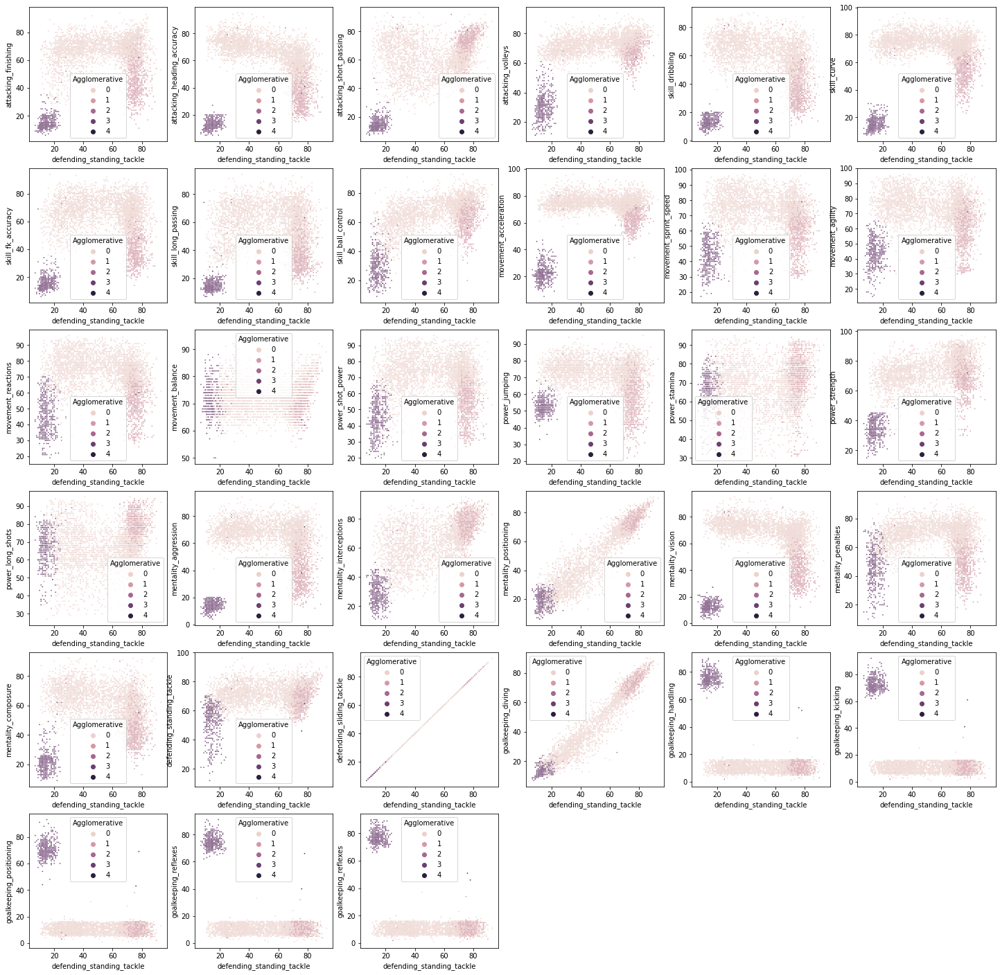

In [ ]:
bool_crack=df_n["overall"] > 85

plt.figure(figsize=(25,25))

for i,skill in enumerate(skills_ratings):
    skill_1 = skills_ratings[skill_i]
    skill_2 = skills_ratings[i]
    plt.xlabel(skill_1)
    plt.ylabel(skill_2)
    plt.subplot(6,6,i+1)
    sns.scatterplot(x = df_n[skill_1], y=df_n[skill_2],s=3,c=bool_crack, hue = df_n['Agglomerative'], cmap = 'hsv_r')
    
plt.show()


In [ ]:
Agglomerative_clusters = go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],
                           mode='markers',
                        text=df_n.loc[:,'short_name'],
                           marker=dict(
                                size=5,
                                color = clusters.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills.loc[bool_crack,skill_1], y=df_skills.loc[bool_crack,skill_2],name='Top players',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[Agglomerative_clusters,crack]

layout = go.Layout(title="Agglomerative",titlefont=dict(size=20),
                xaxis=dict(title=skill_1),
                yaxis=dict(title=skill_2),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

In [ ]:
#En Colab
fig.show(renderer="colab")

In [ ]:
tsne = manifold.TSNE(n_components=2, verbose=1,perplexity=30, n_iter=1000)
df_skills_tsne = tsne.fit_transform(df_skills)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 4512 samples in 0.022s...
[t-SNE] Computed neighbors for 4512 samples in 1.077s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4512
[t-SNE] Computed conditional probabilities for sample 2000 / 4512
[t-SNE] Computed conditional probabilities for sample 3000 / 4512
[t-SNE] Computed conditional probabilities for sample 4000 / 4512
[t-SNE] Computed conditional probabilities for sample 4512 / 4512
[t-SNE] Mean sigma: 12.235446
[t-SNE] KL divergence after 250 iterations with early exaggeration: 75.547562
[t-SNE] KL divergence after 1000 iterations: 1.776022


In [ ]:
agglom_clusters = go.Scatter(x=df_skills_tsne[:,0], y=df_skills_tsne[:,1],
                           mode='markers',
                        text=df_n.loc[:,'short_name'],
                           marker=dict(
                                size=5,
                                color = clusters.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills_tsne[bool_crack,0], y=df_skills_tsne[bool_crack,1],name='Ckacks!!',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[agglom_clusters,crack]

layout = go.Layout(title="Agglomerative - t-SNE",titlefont=dict(size=20),
                xaxis=dict(title='componente_1'),
                yaxis=dict(title='componente_2'),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

In [ ]:
#En Colab
fig.show(renderer="colab")

**Se distingue claramente el cluster 3 (Arqueros), y los otros clusters importantes son el 0 y el 1, aunque no es muy clara su división en la proyección TSNE**

Para n_clusters = 2 El silhouette_score promedio es : 0.2837967367528344
Para n_clusters = 3 El silhouette_score promedio es : 0.2837967367528344
Para n_clusters = 4 El silhouette_score promedio es : 0.2837967367528344
Para n_clusters = 5 El silhouette_score promedio es : 0.2837967367528344
Para n_clusters = 6 El silhouette_score promedio es : 0.2837967367528344


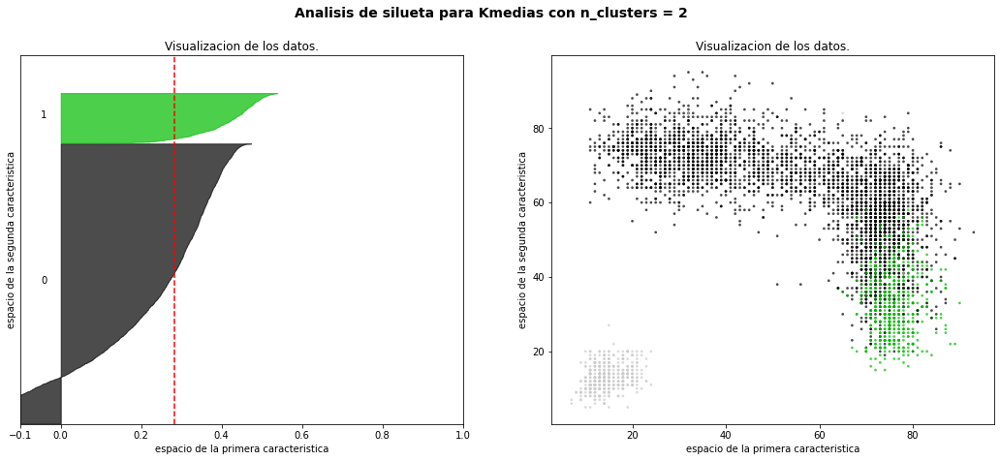

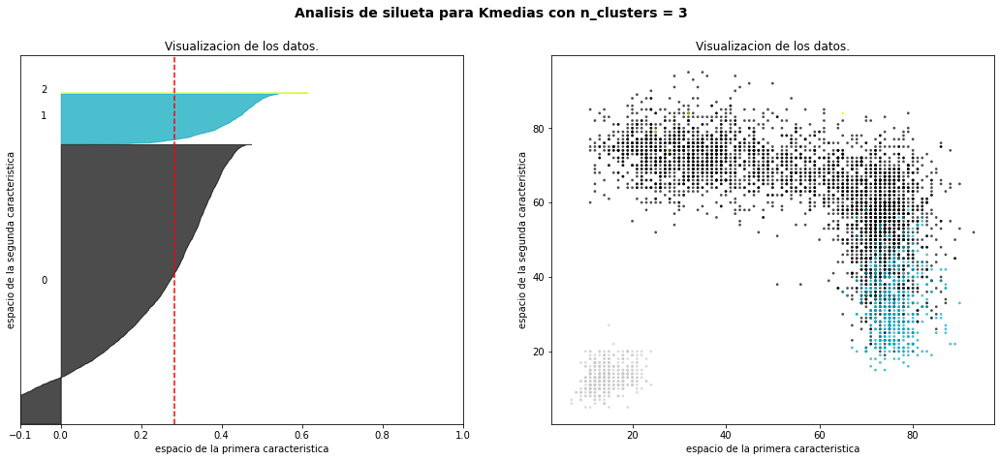

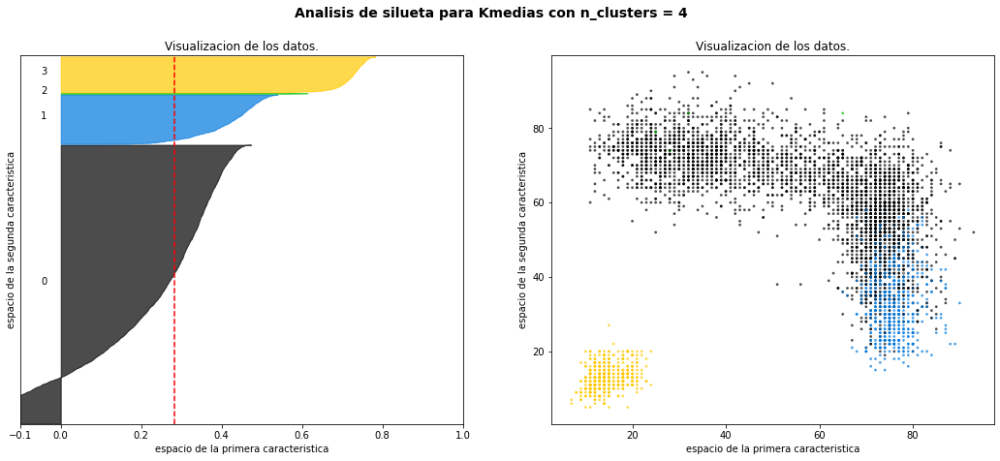

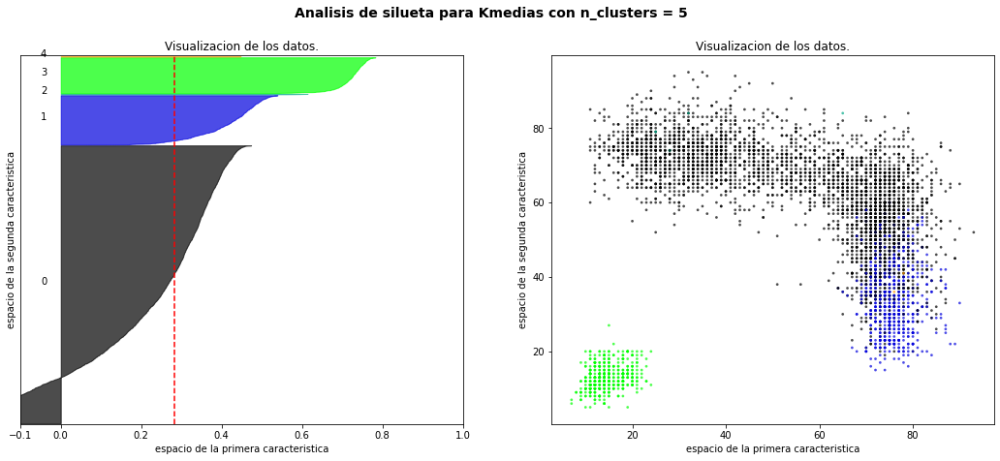

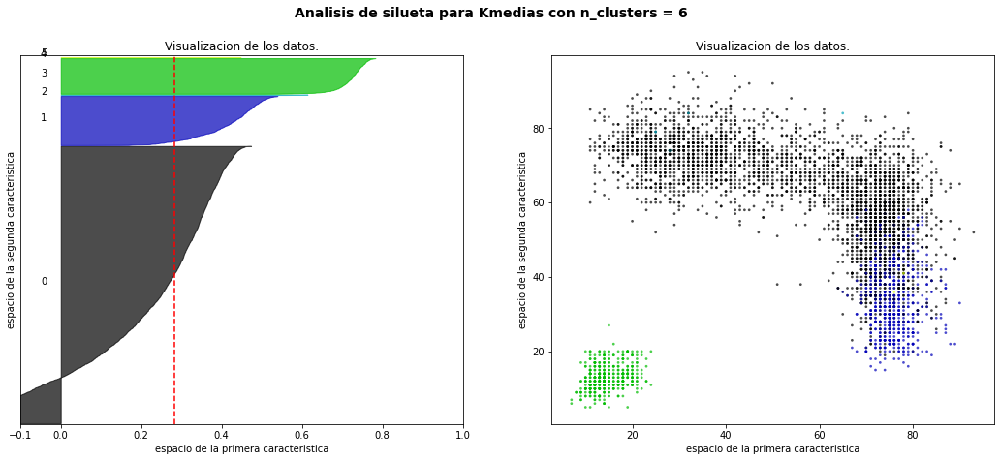

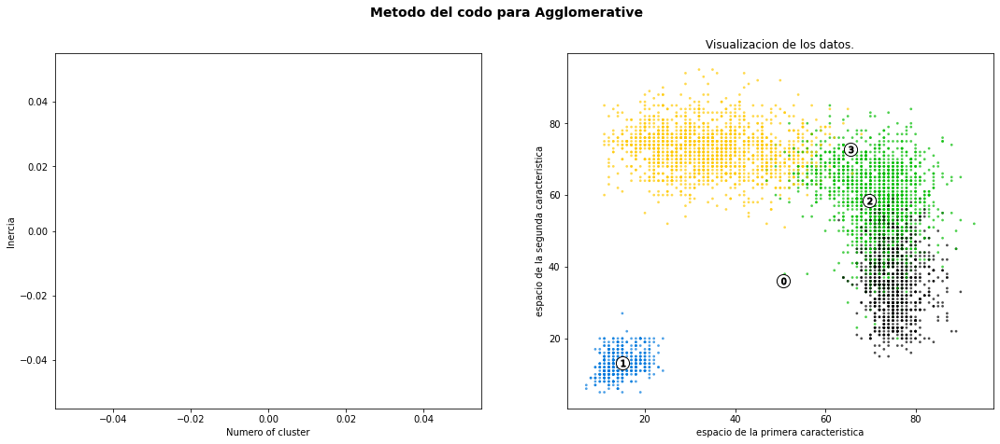

In [ ]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

range_n_clusters = [2,3, 4, 5, 6]
sse ={}
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(df_skills) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = AgglomerativeClustering(n_clusters=n_clust, linkage='average', affinity='cityblock')
    cluster_labels = clusterer.fit_predict(df_skills)
    # sse[n_clusters] = clusterer.inertia_

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(df_skills, cluster_labels)
    print("Para n_clusters =", n_clusters,
          "El silhouette_score promedio es :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_skills, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Visualizacion de los datos.")
    ax1.set_xlabel("espacio de la primera caracteristica")
    ax1.set_ylabel("espacio de la segunda caracteristica")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(df_skills[skill_1], df_skills[skill_2], marker='.', s=30, lw=0, alpha=0.7,
                c = colors,edgecolor='k')

    # Labeling the clusters
    # centers = clusterer.cluster_centers_
    # # Draw white circles at cluster centers
    # ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
    #             c="white", alpha=1, s=200, edgecolor='k')

    # for i, c in enumerate(centers):
    #     ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
    #                 s=50, edgecolor='k')

    ax2.set_title("Visualizacion de los datos.")
    ax2.set_xlabel("espacio de la primera caracteristica")
    ax2.set_ylabel("espacio de la segunda caracteristica")

    plt.suptitle(("Analisis de silueta para Kmedias "
                  "con n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    #plt.savefig("kmeans_%d" % n_clusters, dpi=300)

plt.show()

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18, 7)
plt.suptitle(("Metodo del codo para Agglomerative "),
                 fontsize=14, fontweight='bold')
ax1.plot(list(sse.keys()), list(sse.values()))
ax1.set_xlabel("Numero of cluster")
ax1.set_ylabel("Inercia")

clusterer = KMeans(n_clusters=4, random_state=10)
cluster_labels = clusterer.fit_predict(df_skills)
    
colors = cm.nipy_spectral(cluster_labels.astype(float) / 4)
ax2.scatter(df_skills[skill_1], df_skills[skill_2], marker='.', s=30, lw=0, alpha=0.7, c = colors, edgecolor='k')

# Labeling the clusters
centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
ax2.scatter(centers[:, 0], centers[:, 1], marker='o',c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centers):
    ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,s=50, edgecolor='k')

ax2.set_title("Visualizacion de los datos.")
ax2.set_xlabel("espacio de la primera caracteristica")
ax2.set_ylabel("espacio de la segunda caracteristica")

#plt.savefig("kmeans_elbow", dpi=300)
plt.show()

# 8.-Clustering-con-Agglomerative sin arqueros

In [ ]:
n=10000
df_n=df.loc[:n]
df_n=df_n[(df_n["player_positions"]!='GK')&(df_n['overall']>69)]

df_skills=df_n[skills_ratings]


In [ ]:
# Número de clusters buscado
n_clust = 4

clustering = AgglomerativeClustering(n_clusters=n_clust, linkage='average', affinity='cityblock')
clustering.fit(df_skills)

clusters = clustering.labels_
#cluster_centers = clustering.cluster_centers_

labels_unique = np.unique(clusters)
n_clusters_ = len(labels_unique)

In [ ]:
df_n['Agglomerative_SA'] = clustering.labels_

In [ ]:
#Observaciones por cluster
df_n["Agglomerative_SA"].value_counts()

0    4185
3     670
2      10
1       4
Name: Agglomerative_SA, dtype: int64

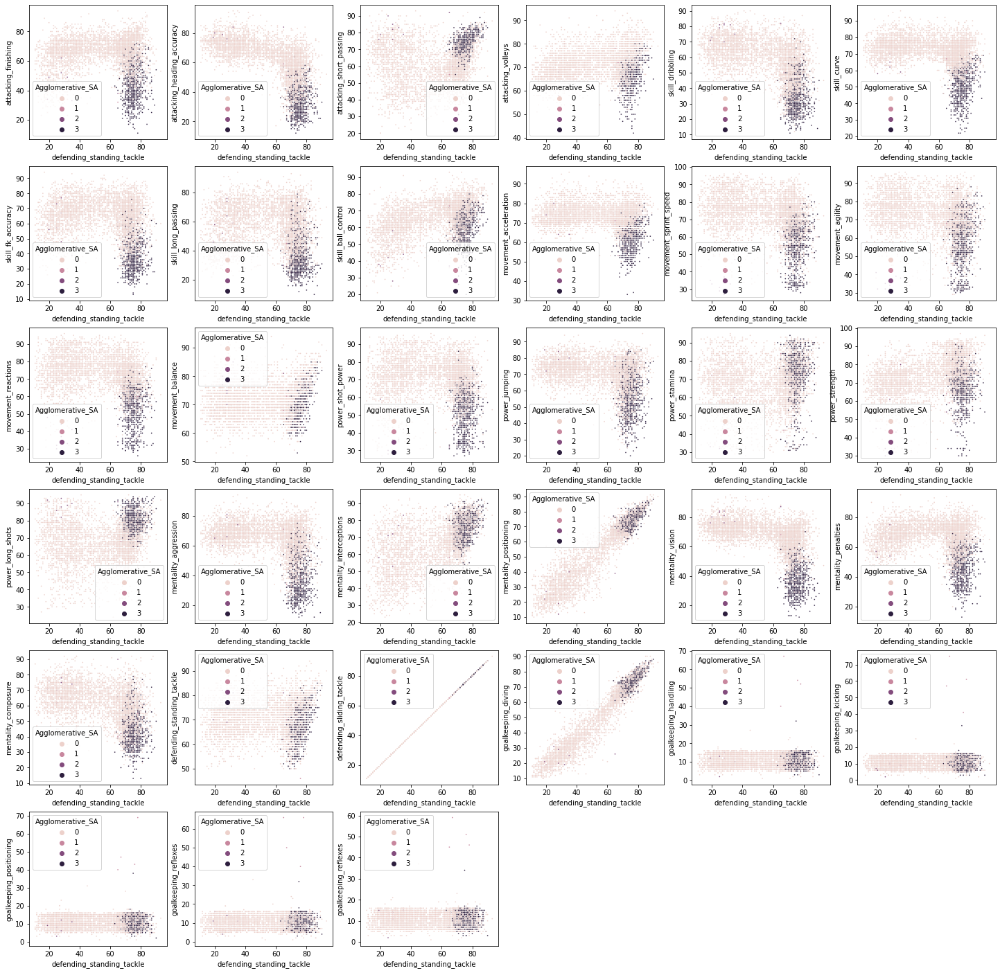

In [ ]:
bool_crack=df_n["overall"] > 85

plt.figure(figsize=(25,25))

for i,skill in enumerate(skills_ratings):
    skill_1 = skills_ratings[skill_i]
    skill_2 = skills_ratings[i]
    plt.xlabel(skill_1)
    plt.ylabel(skill_2)
    plt.subplot(6,6,i+1)
    sns.scatterplot(x = df_n[skill_1], y=df_n[skill_2],s=3,c=bool_crack, hue = df_n['Agglomerative_SA'], cmap = 'hsv_r')
    
plt.show()

In [ ]:
bool_crack=df_n["overall"] > 85
bool_no_crack=df_n["overall"]<86

In [ ]:
Agglomerative_clusters = go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],
                           mode='markers',
                        text=df_n.loc[:,'short_name'],
                           marker=dict(
                                size=5,
                                color = clusters.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills.loc[bool_crack,skill_1], y=df_skills.loc[bool_crack,skill_2],name='Top players',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[Agglomerative_clusters,crack]

layout = go.Layout(title="Agglomerative",titlefont=dict(size=20),
                xaxis=dict(title=skill_1),
                yaxis=dict(title=skill_2),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

In [ ]:
#En Colab
fig.show(renderer="colab")

In [ ]:
tsne = manifold.TSNE(n_components=2, verbose=1,perplexity=30, n_iter=1000)
df_skills_tsne = tsne.fit_transform(df_skills)

In [ ]:
agglom_clusters = go.Scatter(x=df_skills_tsne[:,0], y=df_skills_tsne[:,1],
                           mode='markers',
                        text=df_n.loc[:,'short_name'],
                           marker=dict(
                                size=5,
                                color = clusters.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills_tsne[bool_crack,0], y=df_skills_tsne[bool_crack,1],name='Ckacks!!',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[agglom_clusters,crack]

layout = go.Layout(title="Agglomerative - t-SNE",titlefont=dict(size=20),
                xaxis=dict(title='componente_1'),
                yaxis=dict(title='componente_2'),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

In [ ]:
#En Colab
fig.show(renderer="colab")

Para n_clusters = 2 El silhouette_score promedio es : 0.22758550151836734
Para n_clusters = 3 El silhouette_score promedio es : 0.22758550151836734
Para n_clusters = 4 El silhouette_score promedio es : 0.22758550151836734
Para n_clusters = 5 El silhouette_score promedio es : 0.22758550151836734
Para n_clusters = 6 El silhouette_score promedio es : 0.22758550151836734


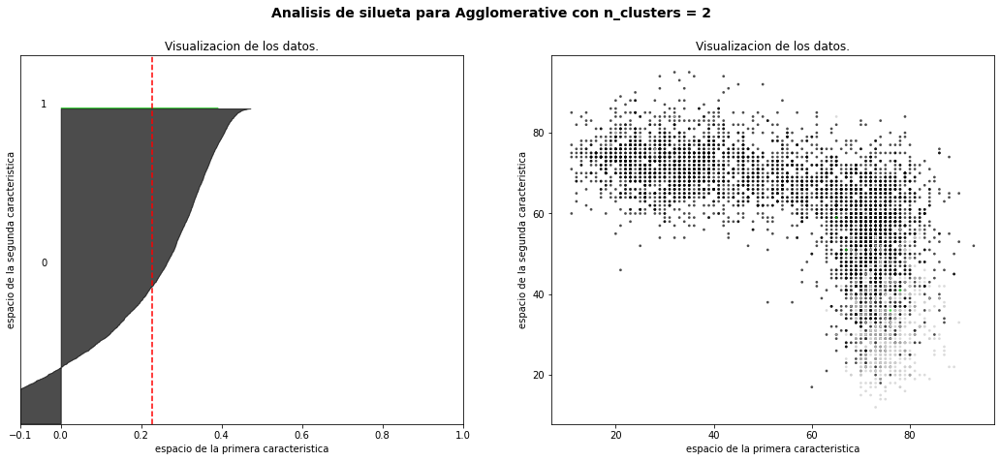

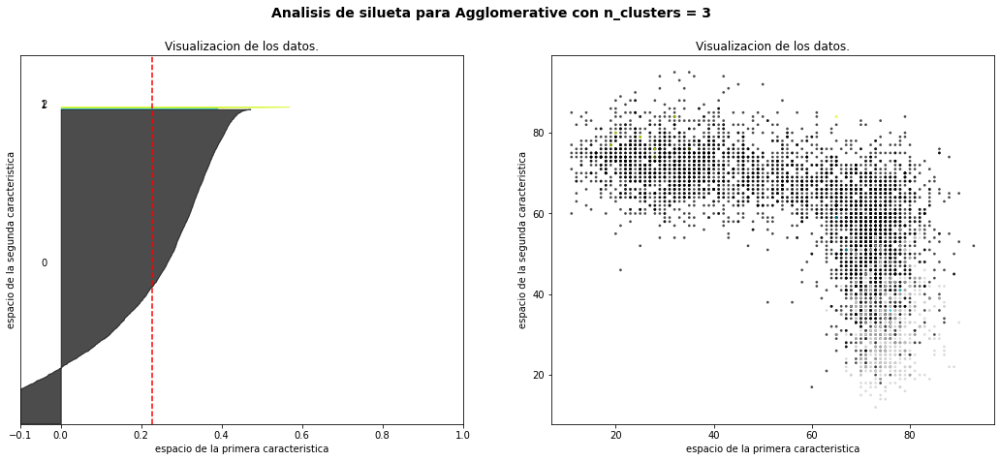

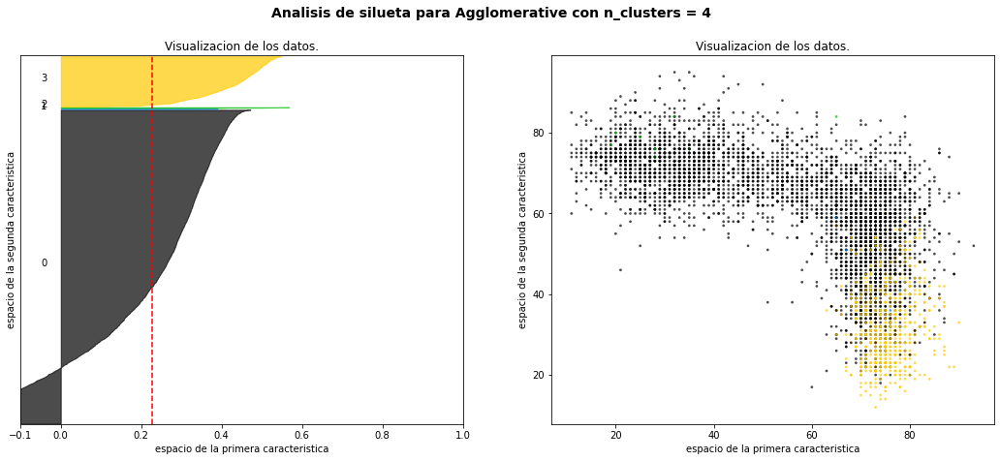

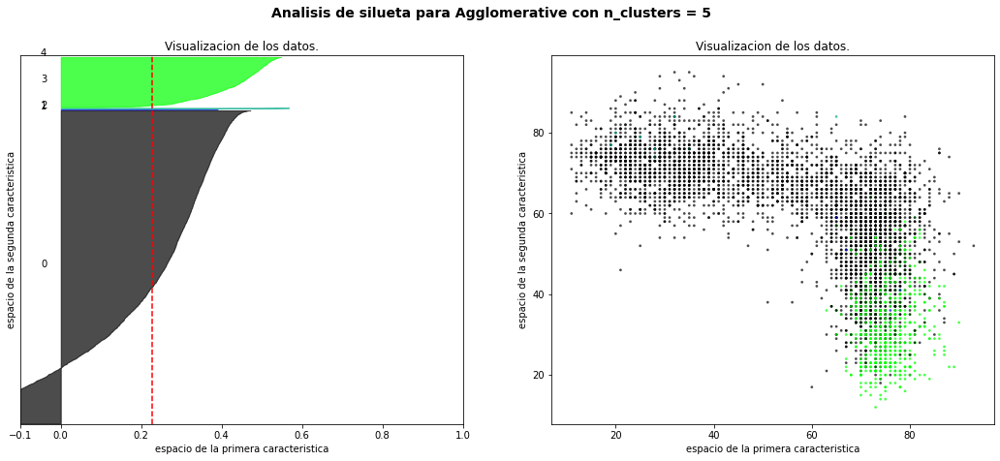

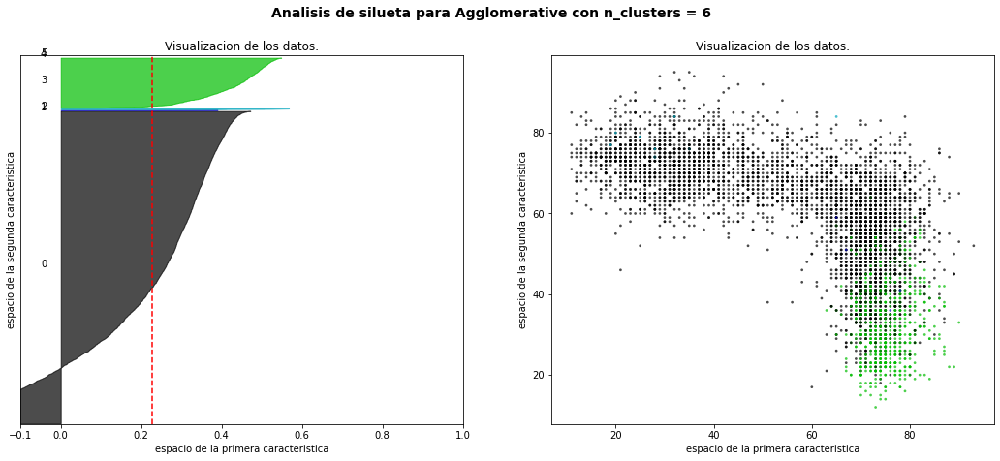

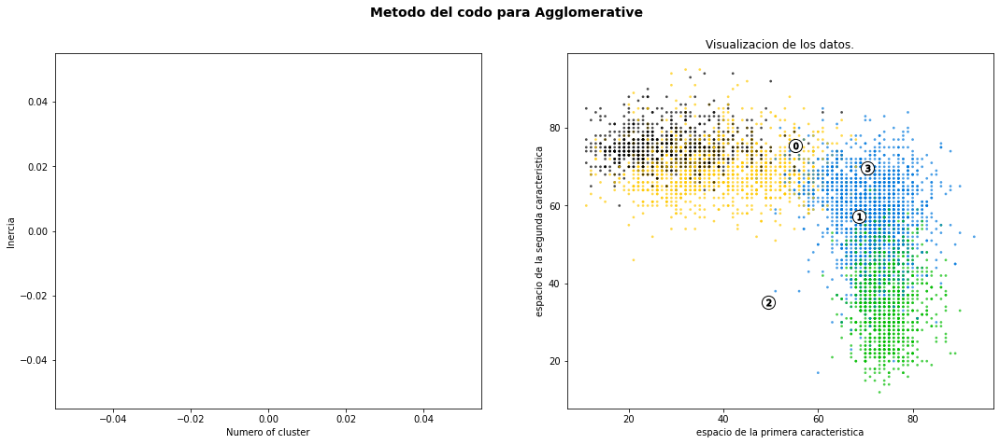

In [ ]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

range_n_clusters = [2,3, 4, 5, 6]
sse ={}
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(df_skills) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = AgglomerativeClustering(n_clusters=n_clust, linkage='average', affinity='cityblock')
    cluster_labels = clusterer.fit_predict(df_skills)
    # sse[n_clusters] = clusterer.inertia_

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(df_skills, cluster_labels)
    print("Para n_clusters =", n_clusters,
          "El silhouette_score promedio es :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_skills, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Visualizacion de los datos.")
    ax1.set_xlabel("espacio de la primera caracteristica")
    ax1.set_ylabel("espacio de la segunda caracteristica")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(df_skills[skill_1], df_skills[skill_2], marker='.', s=30, lw=0, alpha=0.7,
                c = colors,edgecolor='k')

    # Labeling the clusters
    # centers = clusterer.cluster_centers_
    # # Draw white circles at cluster centers
    # ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
    #             c="white", alpha=1, s=200, edgecolor='k')

    # for i, c in enumerate(centers):
    #     ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
    #                 s=50, edgecolor='k')

    ax2.set_title("Visualizacion de los datos.")
    ax2.set_xlabel("espacio de la primera caracteristica")
    ax2.set_ylabel("espacio de la segunda caracteristica")

    plt.suptitle(("Analisis de silueta para Agglomerative "
                  "con n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    #plt.savefig("kmeans_%d" % n_clusters, dpi=300)

plt.show()

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18, 7)
plt.suptitle(("Metodo del codo para Agglomerative "),
                 fontsize=14, fontweight='bold')
ax1.plot(list(sse.keys()), list(sse.values()))
ax1.set_xlabel("Numero of cluster")
ax1.set_ylabel("Inercia")

clusterer = KMeans(n_clusters=4, random_state=10)
cluster_labels = clusterer.fit_predict(df_skills)
    
colors = cm.nipy_spectral(cluster_labels.astype(float) / 4)
ax2.scatter(df_skills[skill_1], df_skills[skill_2], marker='.', s=30, lw=0, alpha=0.7, c = colors, edgecolor='k')

# Labeling the clusters
centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
ax2.scatter(centers[:, 0], centers[:, 1], marker='o',c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centers):
    ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,s=50, edgecolor='k')

ax2.set_title("Visualizacion de los datos.")
ax2.set_xlabel("espacio de la primera caracteristica")
ax2.set_ylabel("espacio de la segunda caracteristica")

#plt.savefig("kmeans_elbow", dpi=300)
plt.show()

**Las pruebas de silueta con distinta cantidad de clusters indican que Agglomerative no funciona muy bien con la distribución de nuestros datos**

# Conclusiones

A partir de las pruebas con los distintos tipos de métodos de Clustering, obtuvimos los resultados más interpretables con KMeans. Si tomamos al Dataset entero (incluyendo a los arqueros) podemos caracterizar a los clusters encontrados de la siguiente manera: 

- Cluster 0 - Atacantes: Son los que arman el juego de ataques. Son los mejores en Crossing, Dribling, Curve, FK_Accuracy, BallControl, Acceleration, SprintSpeed, Agility, Balance.  

- Cluster 1 - Armadores: son muy buenos pasando la pelota. De hecho se detacan en Short y Long Passing. Tambien son los que tienen mas alta Stamina (fortaleza física y mental). Si bien no son los "mejores" en muchas categorías, tienen un buen rendimiento eb casi todas. Abajo calculamos el promedio de todas las categorias y son los que tienen el valor más alto (59). Esto indica que son jugadores muy completos.

- Cluster 2 - Defensores: se destacan en Heading Accuracy, Jumping, Interceptions, Fortaleza, Agresión

- Cluster 3 - Arqueros

- Cluster 4 - Definidores: son muy buenos en finnishing (hace gol), positioning (ubicarse para recibir el balón), Heading Accuracy, Shoot Power. Sus debilidaes son Marking e Interceptions. Esto es normal ya que el estado natural de estos jugadores es buscar la situación de gol.
